In [2]:
!pip install pytesseract

  Created wheel for pytesseract: filename=pytesseract-0.3.8-py2.py3-none-any.whl size=14067 sha256=f88c831d4cf595b0c955062ac23e1868be807bbc9002a6f399f60b4761745aeb
  Stored in directory: c:\users\kalim\appdata\local\pip\cache\wheels\ed\8a\c6\40c7ec06c2dd3df636832537238128a1471bf9c1b6a3a9bf40
Successfully built pytesseract


In [185]:
!pip install img2pdf

In [20]:
import cv2 
import numpy as np
import pytesseract
from matplotlib import pyplot as plt

import glob
import requests
import img2pdf
import json

img = cv2.imread('test.png')
img = img[260:336, :]


# Adding custom options
pytesseract.pytesseract.tesseract_cmd = r"C:\Program Files\Tesseract-OCR\tesseract.exe"
custom_config = r'--oem 3 --psm 6'
pytesseract.image_to_string(img, config=custom_config)

"ee \\ = Lf ee\nL In the Name of Gaderaise [oy=m Co) pattiatin Ss\n= re\n= the-Lord:6f'the*worlds ——=—_[—_——\n\x0c"

In [5]:
img.shape

(76, 615, 3)

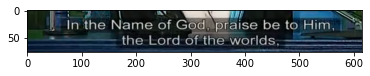

In [9]:
# dmc = img[300:588, 1225:1512]
plt.imshow(img)
plt.show()

# Using pytesseract

In [10]:
# get grayscale image
def get_grayscale(image):
    return cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# noise removal
def remove_noise(image):
    return cv2.medianBlur(image,3)
 
#thresholding
def thresholding(image):
    return cv2.threshold(image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]

In [11]:
gray = get_grayscale(img)
thresh = thresholding(gray)
rm_noise = remove_noise(gray)


In [12]:
pytesseract.image_to_string(img, config=custom_config)

"ee \\ = Lf ee\nL In the Name of Gaderaise [oy=m Co) pattiatin Ss\n= re\n= the-Lord:6f'the*worlds ——=—_[—_——\n\x0c"

In [13]:
pytesseract.image_to_string(gray, config=custom_config)

'a \\ ss \\nnidel ll =e\n|" in the Name of God Praise be toHim, |\n~ —— the-Lord-of the\'worlds,;=—=—___—\n\x0c'

In [14]:
# img = cv2.imread('test.png')

pytesseract.image_to_string(thresh, config=custom_config)

'nd \\ led \\ toed =:\n1 in the Name of God praise be toHim,\n. ——= the Lord of the worlds, —————\n\x0c'

In [15]:
pytesseract.image_to_string(rm_noise, config=custom_config)

'a \\ = Ls =\n| In the Name of God) praise be toHim, 3\nSS OT i ae tel OS\n\x0c'

In [252]:
import cv2
import time
vidcap = cv2.VideoCapture('Sheikh Musa sharif - History.mp4')

52.801393032073975


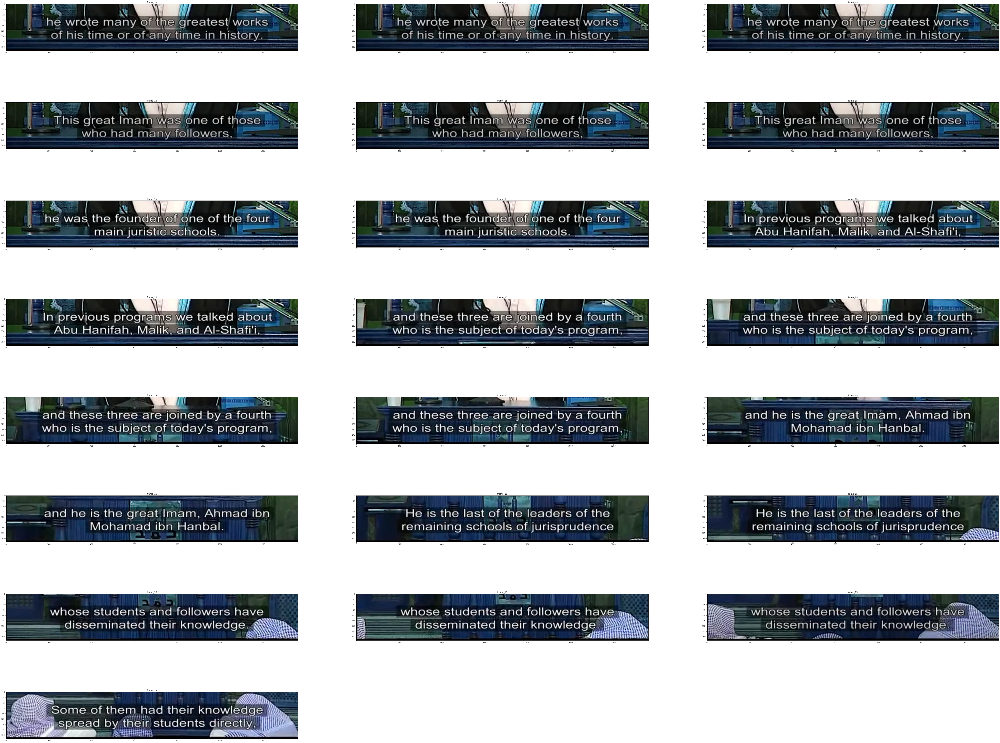

In [253]:
success = True
count = 0
start = time.time()
plain = []
prev_plain = ''
fps = int(vidcap.get(cv2.CAP_PROP_FPS))
img_cnt = 0
fig = plt.figure(figsize=(100, 100))
columns = 3
rows = 10

while success:
    success,image = vidcap.read()
    if count%(2*fps) == 0:
        img_cnt += 1
        image = image[550:, :]
        fig.add_subplot(rows, columns, img_cnt)
        plt.imshow(image)
        plt.axis('on')
#         title = f"frame_{img_cnt}"
#         print(title)
        plt.title(title)
#         plt.show()
        cv2.imwrite(f"history/frame_{img_cnt}.jpg", image)     # save frame as JPEG file      
        gray_image = get_grayscale(image)
        plain.append(ocr_space_file(f"history/frame_{img_cnt}.jpg"))
#         current_plain = pytesseract.image_to_string(gray_image, config=custom_config)  
#         if current_plain != prev_plain:
#             plain += current_plain
#             prev_plain = current_plain
    count += 1
print(time.time()-start)

In [224]:
plain

[{'ParsedResults': [{'TextOverlay': {'Lines': [],
     'HasOverlay': False,
     'Message': 'Text overlay is not provided as it is not requested'},
    'TextOrientation': '0',
    'FileParseExitCode': 1,
    'ParsedText': 'he wrqte many of tbe greates! works\r\nof his time orofeany-time in history.\r\n',
    'ErrorMessage': '',
    'ErrorDetails': ''}],
  'OCRExitCode': 1,
  'IsErroredOnProcessing': False,
  'ProcessingTimeInMilliseconds': '795',
  'SearchablePDFURL': 'Searchable PDF not generated as it was not requested.'},
 {'ParsedResults': [{'TextOverlay': {'Lines': [],
     'HasOverlay': False,
     'Message': 'Text overlay is not provided as it is not requested'},
    'TextOrientation': '0',
    'FileParseExitCode': 1,
    'ParsedText': 'he wrqte many of tbe greates! works\r\nof his time orofeany-time in history.\r\n',
    'ErrorMessage': '',
    'ErrorDetails': ''}],
  'OCRExitCode': 1,
  'IsErroredOnProcessing': False,
  'ProcessingTimeInMilliseconds': '359',
  'SearchablePDFUR

In [187]:
# Converting all images into pdf
with open("history.pdf","wb") as f:
    f.write(img2pdf.convert(glob.glob("history/*.jpg")))

# Using OCR Space API

In [ ]:
OCR API KEY
https://ocr.space/OCRAPI
bf128416cf88957

In [210]:
overlay = False
payload = {'isOverlayRequired': overlay,
               'apikey': 'bf128416cf88957',
               'language': 'eng',
               }
def ocr_space_file(filename):
    with open(filename, 'rb') as f:
        r = requests.post('https://api.ocr.space/parse/image',
                          files={filename: f},
                          data=payload,
                          )
    response = r.content.decode('utf8')    
    return json.loads(response)


In [212]:
text = ocr_space_file('Doc1.pdf')

In [231]:
plain[0]

{'ParsedResults': [{'TextOverlay': {'Lines': [],
    'HasOverlay': False,
    'Message': 'Text overlay is not provided as it is not requested'},
   'TextOrientation': '0',
   'FileParseExitCode': 1,
   'ParsedText': 'he wrqte many of tbe greates! works\r\nof his time orofeany-time in history.\r\n',
   'ErrorMessage': '',
   'ErrorDetails': ''}],
 'OCRExitCode': 1,
 'IsErroredOnProcessing': False,
 'ProcessingTimeInMilliseconds': '795',
 'SearchablePDFURL': 'Searchable PDF not generated as it was not requested.'}

In [232]:
for p in plain:
    for i in p['ParsedResults']:
        print(i['ParsedText'])
        

he wrqte many of tbe greates! works
of his time orofeany-time in history.

he wrqte many of tbe greates! works
of his time orofeany-time in history.

'i
he wrote many Of they greatest works
of his time orofaany-timeinhistory.

This great Imam was one of those
who had many-followers,

This reat Imam was 'one of !hose
who had many-followers,

This great Imamiwas)one of ithose
who had many-followers,

he wa the founderXofrone of type four
main juristic„schools.

he wa the founder(of one of the four
main juristicaschools

In previous progre-m..-&-e
Swe talked about
AbuHanifah, Malik, and A1-Shafi'i,

in previous talked about
AbuHanifah,

He is the last of the leaders of the
remaining schools of jurisprudence

He is the last of the leaders of the
remaining schools of jurisprudence

whose students and followers have
disseminated their knowledge.

whose students and followers have
disseminated their knowledge.

whose students and followers have
disseminated their knowledge.

Some of them had 

In [221]:
for i in text['ParsedResults']:
    print(i['ParsedText'])
    

he wrqte many "of the greatest works
of his time or oftanyvtime in history,
he wr te many Of the greates works
_A-Z of his time or ofrany-time in history,
This great Imarnyas one of those
who had many followers,
This reat I manu_vyas one of
f who had many-followers,
he wa the founder uo'ne of
main juristicsschools.
In prevpus talkeg about
Abu Hanifah, Malik,»and A1-Shafi'i,
in pre lous talke about
Abu Hanifah, MaliWand A1-Shafi'j,
and these three are joined by a fourth
who is the subject of today's programe—

and these three are joined by affourth —
who is the sübjee€d-tdday's program,
and he is the great Imam, Ahmad ibn
Mohamad ibn Hanbal.
and he is the great Imam, Ahmad ibn
Mohamad ibn Hanbal.
He is the last of the leaders of the
remaining schools of jurisprudence
whose students and followers have
their knowledge.
whosestudents and followers haVé
disseminated their knowledge.
Some of them had their knowledge
spread by their' students diiectly.



# Using OCR Web Service

In [16]:
LicenseCode = '46FB2BFB-90A1-4B76-86C2-CF8F7BE21520'
UserName =  'kalim'

LicenseCode = 'D7952445-51DB-48F4-923A-223434AA1C47'
UserName = 'ibrahim123'

## single image - 25/day

In [21]:
RequestUrl = "http://www.ocrwebservice.com/restservices/processDocument?gettext=true";
FilePath = "history_test.pdf"

for im in glob.glob("history/frame_*.jpg"): 
    FilePath = im
    with open(FilePath, 'rb') as image_file:
        image_data = image_file.read()

    r = requests.post(RequestUrl, data=image_data, auth=(UserName, LicenseCode))

    if r.status_code == 401:
        #Please provide valid username and license code
        print("Unauthorized request")
        exit()

    # Decode Output response
    jobj = json.loads(r.content)

    ocrError = str(jobj["ErrorMessage"])
    
    # Task description
    print("Task Description:" + str(jobj["TaskDescription"]))

    # Available pages 
    print("Available Pages:" + str(jobj["AvailablePages"]))

    # Processed pages 
    print("Processed Pages:" + str(jobj["ProcessedPages"]))

    # For zonal or multipage OCR: OCRText[z][p]    z - zone, p - pages

    # Extracted text from first or single page
    print("Extracted Text:" + str(jobj["OCRText"][0][0]))

    # Extracted text from second page (if multipage doc converted)
    #print("Extracted Text:" + str(jobj["OCRText"][0][1]))

    # Get extracted text from First zone for each page
    print("Zone 1 Page 1 Text:" + str(jobj["OCRText"][0][0]))
#     print("Zone 1 Page 2 Text:" + str(jobj["OCRText"][0][1]))

    print("==================================")

Task Description:None
Available Pages:23
Processed Pages:1
Extracted Text:I - . he wrote many of the greatest works of his time or of any time in history. 
Zone 1 Page 1 Text:I - . he wrote many of the greatest works of his time or of any time in history. 
Task Description:None
Available Pages:22
Processed Pages:1
Extracted Text:In previous programs we talked about Abu Hanifah, Malik, and Al-Shafi'i, 
Zone 1 Page 1 Text:In previous programs we talked about Abu Hanifah, Malik, and Al-Shafi'i, 
Task Description:None
Available Pages:21
Processed Pages:1
Extracted Text:, 41...---• .•_ ,. and these three are joined by a fourth '--: who is the subject of today's program, _ 
Zone 1 Page 1 Text:, 41...---• .•_ ,. and these three are joined by a fourth '--: who is the subject of today's program, _ 
Task Description:None
Available Pages:20
Processed Pages:1
Extracted Text:/ . . and these three are joined by a. fourth - who is the subject of today's program, 
Zone 1 Page 1 Text:/ . . and these th

In [255]:
jobj

{'ErrorMessage': 'Daily page limit exceeded',
 'OutputInformation': '',
 'AvailablePages': 0,
 'ProcessedPages': 0,
 'OCRText': [],
 'OutputFileUrl': '',
 'OutputFileUrl2': '',
 'OutputFileUrl3': '',
 'Reserved': [],
 'OCRWords': [],
 'TaskDescription': ''}

## pdf

In [248]:

RequestUrl = "http://www.ocrwebservice.com/restservices/processDocument?gettext=true";
FilePath = "Doc1.pdf"

#     FilePath = im
with open(FilePath, 'rb') as image_file:
    image_data = image_file.read()

r = requests.post(RequestUrl, data=image_data, auth=(UserName, LicenseCode))

if r.status_code == 401:
    #Please provide valid username and license code
    print("Unauthorized request")
    exit()

# Decode Output response
jobj = json.loads(r.content)

ocrError = str(jobj["ErrorMessage"])

# Task description
print("Task Description:" + str(jobj["TaskDescription"]))

# Available pages 
print("Available Pages:" + str(jobj["AvailablePages"]))

# Processed pages 
print("Processed Pages:" + str(jobj["ProcessedPages"]))

# For zonal or multipage OCR: OCRText[z][p]    z - zone, p - pages

# Extracted text from first or single page
print("Extracted Text:" + str(jobj["OCRText"][0][0]))

# Extracted text from second page (if multipage doc converted)
#print("Extracted Text:" + str(jobj["OCRText"][0][1]))

# Get extracted text from First zone for each page
print("Zone 1 Page 1 Text:" + str(jobj["OCRText"][0][0]))
#     print("Zone 1 Page 2 Text:" + str(jobj["OCRText"][0][1]))

print("==================================")

Task Description:None
Available Pages:23
Processed Pages:2
Extracted Text:he wrote many o th greatest works of his time or of any time in history. 'he wrote many of the greatest works of his time or of any time in history. who had many followers, ■ et'he wa the founder of one of the four   I main juristic schools. In previous programs we talked about Abu Hanifah, Malik, and Al-Shafi'i, n previous programs we talked about. Abu Hanifah, Malik, and Al-Shafi'i, and these three are joined by a fourth who is the subject of today's program, 64k.: 
Zone 1 Page 1 Text:he wrote many o th greatest works of his time or of any time in history. 'he wrote many of the greatest works of his time or of any time in history. who had many followers, ■ et'he wa the founder of one of the four   I main juristic schools. In previous programs we talked about Abu Hanifah, Malik, and Al-Shafi'i, n previous programs we talked about. Abu Hanifah, Malik, and Al-Shafi'i, and these three are joined by a fourth who is 

In [235]:
glob.glob("history/frame_*.jpg")

['history\\frame_1.jpg',
 'history\\frame_10.jpg',
 'history\\frame_11.jpg',
 'history\\frame_12.jpg',
 'history\\frame_13.jpg',
 'history\\frame_14.jpg',
 'history\\frame_15.jpg',
 'history\\frame_16.jpg',
 'history\\frame_17.jpg',
 'history\\frame_18.jpg',
 'history\\frame_19.jpg',
 'history\\frame_2.jpg',
 'history\\frame_20.jpg',
 'history\\frame_21.jpg',
 'history\\frame_22.jpg',
 'history\\frame_3.jpg',
 'history\\frame_4.jpg',
 'history\\frame_5.jpg',
 'history\\frame_6.jpg',
 'history\\frame_7.jpg',
 'history\\frame_8.jpg',
 'history\\frame_9.jpg']